### Cleaning FARS 2020 Data

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import datetime as dt
import time

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay


from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [4]:
## reading in FARS 2020 CSVs

df_vehicle = pd.read_csv("./data/2020_fars/vehicle.csv", encoding='latin-1')
df_vision = pd.read_csv("./data/2020_fars/vision.csv", encoding='latin-1')
df_distract = pd.read_csv("./data/2020_fars/distract.CSV", encoding='latin-1')
df_maneuver = pd.read_csv("./data/2020_fars/maneuver.CSV", encoding='latin-1')
df_weather = pd.read_csv("./data/2020_fars/weather.CSV", encoding='latin-1')
df_accident = pd.read_csv("./data/2020_fars/accident.CSV", encoding='latin-1')
df_factor = pd.read_csv("./data/2020_fars/factor.CSV", encoding='latin-1')
df_person = pd.read_csv('./data/2020_fars/person.csv', encoding='latin-1')

# get accident data for all years
df_accident = pd.DataFrame()

for i in range( 2010, 2021):   
    folder_name =  str(i) + '_fars/'
    print(i, folder_name)
    df_accident = df_accident.append(pd.read_csv("./data/" + folder_name + "accident.CSV", encoding='latin-1'))


# Make column names lowercase
df_vehicle.columns = df_vehicle.columns.str.lower()
df_vision.columns = df_vision.columns.str.lower()
df_distract.columns = df_distract.columns.str.lower()
df_maneuver.columns = df_maneuver.columns.str.lower()
df_weather.columns = df_weather.columns.str.lower()
df_accident.columns = df_accident.columns.str.lower()
df_factor.columns = df_factor.columns.str.lower()
df_person.columns = df_person.columns.str.lower()

/Users/jonathanbeltran/opt/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (14,56,58,179,181) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


2010 2010_fars/
2011 2011_fars/
2012 2012_fars/
2013 2013_fars/
2014 2014_fars/
2015 2015_fars/
2016 2016_fars/
2017 2017_fars/


/Users/jonathanbeltran/opt/miniconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (40,42) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


2018 2018_fars/
2019 2019_fars/
2020 2020_fars/


In [5]:
## Since I'm only looking at Vehicle and want to merge with the Accident dataset, I am looking at what columns 
## they have in common to merge

df_vehicle.columns.intersection(df_accident.columns)

Index(['state', 'statename', 'st_case', 've_forms', 'day', 'dayname', 'month',
       'monthname', 'hour', 'hourname', 'minute', 'minutename', 'harm_ev',
       'harm_evname', 'man_coll', 'man_collname'],
      dtype='object')

In [6]:
len(df_vehicle.columns)

201

In [7]:
df_person['inj_sev'].value_counts()

4    38824
0    21773
3     9051
2     8600
1     6038
9     1322
5      275
6        2
Name: inj_sev, dtype: int64

In [8]:
df_vehicle.dtypes

state             int64
statename        object
st_case           int64
veh_no            int64
ve_forms          int64
                  ...  
trlr1gvwrname    object
trlr2gvwr         int64
trlr2gvwrname    object
trlr3gvwr         int64
trlr3gvwrname    object
Length: 201, dtype: object

In [9]:
## To view all outputs for columns
pd.set_option('display.max.columns', None)


In [10]:
# These column names are in the XLS and as per the Validation and User Manauls
cols = ['VEH_NO', "STATE" , "ST_CASE", "VEH_NO","VEH_NO", "NUMOCCS" , "UNITTYPE" , "HIT_RUN", "REG_STAT", "OWNER", "MAKE",
         "MODEL", "BODY_TYP", "MOD_YEAR", "vPICMAKE", 'vPICMODEL', 'IMPACT1', 'vPICBODYCLASS', 'ICFinalBody', 'GVWR_From', 'TOW_VEH',
         'J_KNIFE', 'V_CONFIG', 'CARGO_BT', 'HAZ_INV', 'BUS_USE', 'SPEC_USE', 'EMER_USE', 'TRAV_SP', 'ROLLOVER', 'ROLINLOC', 'DEFORMED',
         'TOWED', 'M_HARM','ownername', 'body_typname', 'statename', 'numoccsname',
       'harm_evname', 'man_collname',  'hit_runname',
       'reg_statname', 'makename', 'body_typname',
       'cargo_btname', 'spec_usename',
       'emer_usename', 'trav_spname', 'rollovername', 
       'impact1name', 'deformedname',
       'speedrelname', 'vtrafwayname', 'vnum_lanname', 'vspd_limname',
       'vprofilename', 'vpavetypname' ]

cols = [x.lower() for x in cols]

In [11]:
df_vehicle[cols].dtypes

veh_no            int64
state             int64
st_case           int64
veh_no            int64
veh_no            int64
numoccs           int64
unittype          int64
hit_run           int64
reg_stat          int64
owner             int64
make              int64
model             int64
body_typ          int64
mod_year          int64
vpicmake          int64
vpicmodel         int64
impact1           int64
vpicbodyclass     int64
icfinalbody       int64
gvwr_from         int64
tow_veh           int64
j_knife           int64
v_config          int64
cargo_bt          int64
haz_inv           int64
bus_use           int64
spec_use          int64
emer_use          int64
trav_sp           int64
rollover          int64
rolinloc          int64
deformed          int64
towed             int64
m_harm            int64
ownername        object
body_typname     object
statename        object
numoccsname      object
harm_evname      object
man_collname     object
hit_runname      object
reg_statname    

In [12]:
len(df_vehicle[cols].columns)

57

In [13]:
df_vehicle_cols = df_vehicle[cols] 

In [14]:
pd.set_option('display.max_rows',len(df_vehicle_cols.columns))
df_vehicle_cols.isna().sum()
#

veh_no           0
state            0
st_case          0
veh_no           0
veh_no           0
numoccs          0
unittype         0
hit_run          0
reg_stat         0
owner            0
make             0
model            0
body_typ         0
mod_year         0
vpicmake         0
vpicmodel        0
impact1          0
vpicbodyclass    0
icfinalbody      0
gvwr_from        0
tow_veh          0
j_knife          0
v_config         0
cargo_bt         0
haz_inv          0
bus_use          0
spec_use         0
emer_use         0
trav_sp          0
rollover         0
rolinloc         0
deformed         0
towed            0
m_harm           0
ownername        0
body_typname     0
statename        0
numoccsname      0
harm_evname      0
man_collname     0
hit_runname      0
reg_statname     0
makename         0
body_typname     0
cargo_btname     0
spec_usename     0
emer_usename     0
trav_spname      0
rollovername     0
impact1name      0
deformedname     0
speedrelname     0
vtrafwayname

In [15]:
##Removing duplicate columns
df_vehicle_cols = df_vehicle_cols.loc[:,~df_vehicle_cols.columns.duplicated()]

In [16]:
df_accident['fatals'].mean(), df_vehicle['make'].mean()

(1.0876123946190857, 38.219192216981135)

## Joning CSVs

In [17]:
df_person_2020 = df_person[['state', 'statename', 'st_case', 'veh_no', 'harm_evname',
       'man_collname', 'make', 'makename', 'body_typ', 'body_typname',
       'mod_year', 'tow_veh', 'spec_use', 'spec_usename', 'emer_use',
       'emer_usename', 'rollover', 'rollovername', 'impact1', 'impact1name',
       'vpicmake', 'vpicmodel', 'vpicbodyclass', 'icfinalbody', 'inj_sev']]

In [18]:
# Joining with accidents
joined_2020_df = pd.merge(df_vehicle_cols, df_person_2020, on=['state', 'statename', 'st_case'], how='inner')
joined_2020_df.drop(columns=['veh_no_y', 'harm_evname_y',
       'man_collname_y', 'make_y', 'makename_y', 'body_typ_y',
       'body_typname_y', 'mod_year_y', 'tow_veh_y', 'spec_use_y',
       'spec_usename_y', 'emer_use_y', 'emer_usename_y', 'rollover_y',
       'rollovername_y', 'impact1_y', 'impact1name_y', 'vpicmake_y',
       'vpicmodel_y', 'vpicbodyclass_y', 'icfinalbody_y'], inplace=True)
joined_2020_df.columns

Index(['veh_no_x', 'state', 'st_case', 'numoccs', 'unittype', 'hit_run',
       'reg_stat', 'owner', 'make_x', 'model', 'body_typ_x', 'mod_year_x',
       'vpicmake_x', 'vpicmodel_x', 'impact1_x', 'vpicbodyclass_x',
       'icfinalbody_x', 'gvwr_from', 'tow_veh_x', 'j_knife', 'v_config',
       'cargo_bt', 'haz_inv', 'bus_use', 'spec_use_x', 'emer_use_x', 'trav_sp',
       'rollover_x', 'rolinloc', 'deformed', 'towed', 'm_harm', 'ownername',
       'body_typname_x', 'statename', 'numoccsname', 'harm_evname_x',
       'man_collname_x', 'hit_runname', 'reg_statname', 'makename_x',
       'cargo_btname', 'spec_usename_x', 'emer_usename_x', 'trav_spname',
       'rollovername_x', 'impact1name_x', 'deformedname', 'speedrelname',
       'vtrafwayname', 'vnum_lanname', 'vspd_limname', 'vprofilename',
       'vpavetypname', 'inj_sev'],
      dtype='object')

In [19]:
##Removing duplicate columns
joined_2020_df = joined_2020_df.loc[:,~joined_2020_df.columns.duplicated()]

In [20]:
joined_2020_df.columns = joined_2020_df.columns.str.replace('_x', '')

In [21]:
joined_2020_df['inj_sev'].value_counts()

4    60107
0    43658
2    17803
3    17651
1    13574
9     2019
5      484
6        3
Name: inj_sev, dtype: int64

In [22]:
## removing unknown or unreported inj severity as well as people who died before an accident

joined_2020_df = joined_2020_df[joined_2020_df['inj_sev'] != 9]
joined_2020_df = joined_2020_df[joined_2020_df['inj_sev'] != 6]

In [23]:
#Binarizing inj sev into fatal injury and non fatal injury
joined_2020_df['inj_sev'] = joined_2020_df['inj_sev'].map(lambda x: 1 if x == 4 else 0)

In [46]:
joined_2020_df['inj_sev'].value_counts()

0    48374
1    29306
Name: inj_sev, dtype: int64

In [25]:
joined_2020_df.columns

Index(['veh_no', 'state', 'st_case', 'numoccs', 'unittype', 'hit_run',
       'reg_stat', 'owner', 'make', 'model', 'body_typ', 'mod_year',
       'vpicmake', 'vpicmodel', 'impact1', 'vpicbodyclass', 'icfinalbody',
       'gvwr_from', 'tow_veh', 'j_knife', 'v_config', 'cargo_bt', 'haz_inv',
       'bus_use', 'spec_use', 'emer_use', 'trav_sp', 'rollover', 'rolinloc',
       'deformed', 'towed', 'm_harm', 'ownername', 'body_typname', 'statename',
       'numoccsname', 'harm_evname', 'man_collname', 'hit_runname',
       'reg_statname', 'makename', 'cargo_btname', 'spec_usename',
       'emer_usename', 'trav_spname', 'rollovername', 'impact1name',
       'deformedname', 'speedrelname', 'vtrafwayname', 'vnum_lanname',
       'vspd_limname', 'vprofilename', 'vpavetypname', 'inj_sev'],
      dtype='object')

In [26]:
len(joined_2020_df.columns)

55

### Making Dummies

In [27]:
## Getting dummies for cat data 

joined_2020_df = (pd.get_dummies(joined_2020_df, columns=['ownername', 'hit_runname',
       'body_typname', 'deformedname', 'numoccsname',
       'harm_evname', 'man_collname', 'reg_statname', 'makename', 'emer_usename',
       'rollovername', 'impact1name', 'vtrafwayname',], drop_first= True))

In [28]:
## FInding highly correlated features
corr = joined_2020_df.corr().sort_values('inj_sev', ascending=False).index

In [29]:
# corr[1:10]
len(list(corr))



364

In [30]:
# cols = [ c.lower() for c in cols]
# cols_with_names = [ c.lower() for c in cols_with_names]
# cols_main_names = [ c.lower() for c in cols_main_names]

## EDA

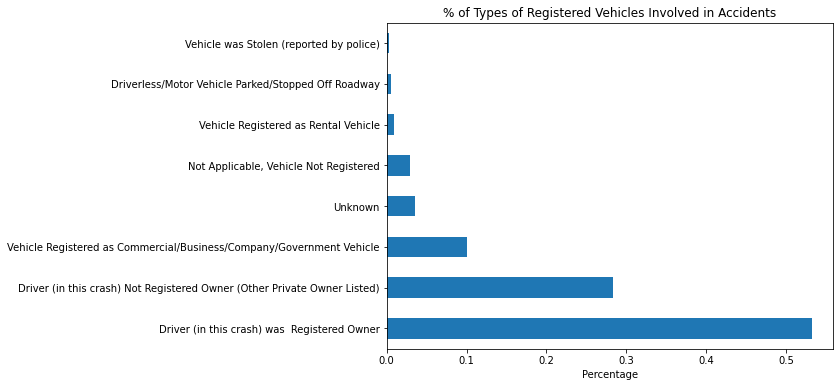

In [31]:
plt.figure(figsize=(8,6))
df_vehicle_cols['ownername'].value_counts(ascending=False, normalize=True).plot(kind='barh')
plt.title("% of Types of Registered Vehicles Involved in Accidents")
plt.xlabel('Percentage');

In [32]:
df_vehicle_cols[['hit_run', 'hit_runname']].value_counts()

hit_run  hit_runname
0        No             51699
1        Yes             2573
dtype: int64

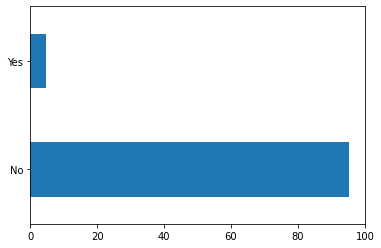

In [33]:
(df_vehicle_cols['hit_runname'].value_counts(normalize=True)*100).plot(kind='barh');

In [34]:
df_vehicle.columns

Index(['state', 'statename', 'st_case', 'veh_no', 've_forms', 'numoccs',
       'numoccsname', 'day', 'dayname', 'month',
       ...
       'gvwr_from', 'gvwr_fromname', 'gvwr_to', 'gvwr_toname', 'trlr1gvwr',
       'trlr1gvwrname', 'trlr2gvwr', 'trlr2gvwrname', 'trlr3gvwr',
       'trlr3gvwrname'],
      dtype='object', length=201)

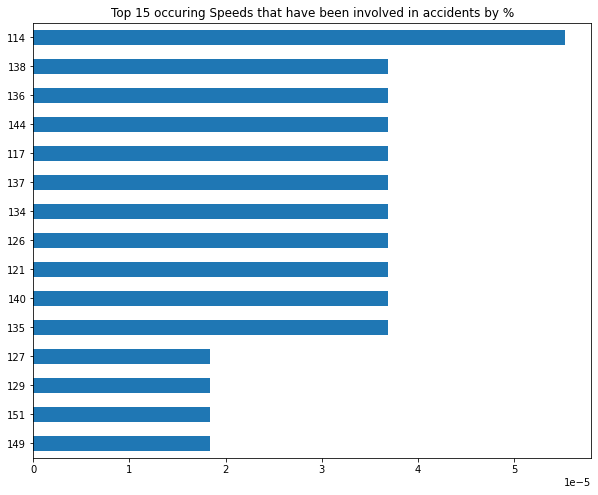

In [35]:
## Top 15 occurring speeds involved in a car accident
plt.figure(figsize=(10,8))
(df_vehicle_cols['trav_sp'].value_counts(ascending=True, normalize=True)[:15]).plot(kind='barh')
plt.title("Top 15 occuring Speeds that have been involved in accidents by %");

In [36]:
df_vehicle_cols.shape

(54272, 54)

In [37]:
df_vehicle_cols = df_vehicle_cols[df_vehicle_cols['trav_sp'] != 999]

In [38]:
df_vehicle_cols.shape

(49246, 54)

In [39]:
df_vehicle_cols = df_vehicle_cols[df_vehicle_cols['trav_sp'] != 998]

<AxesSubplot:>

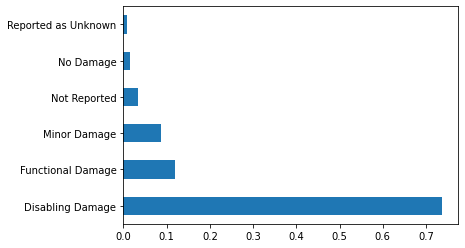

In [40]:
df_vehicle_cols['deformedname'].value_counts(ascending=False, normalize=True)[:15].plot(kind='barh')
# sns.barplot(x=df_vehicle_cols['trav_sp'].value_counts(ascending=False, normalize=True)[:10], y=df_vehicle_cols["deformedname"].value_counts(ascending=False, normalize=True)[:10], data=df_vehicle_cols), hue=df_vehicle_cols["deformedname"].value_counts(ascending=False, normalize=True)[:10], df_vehicle_cols)

In [41]:
## Removing Unknown speeds
joined_2020_df= joined_2020_df[joined_2020_df['trav_sp'] != 998]

<Figure size 720x864 with 0 Axes>

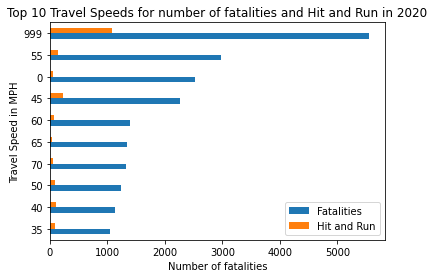

In [42]:
# Just in 2020 - not needed; percent is more relevant to compare with holiday percentages in 2020
plt.figure(figsize=(10,12));
labels = ["Fatalities", "Hit and Run"];

joined_2020_df.groupby(by=["trav_sp"]).sum().sort_values(by= "inj_sev", 
                                                    ascending=False)[["inj_sev", 'hit_run']].head(10).sort_values( by="inj_sev", ascending=True).plot(kind= 'barh');

plt.title("Top 10 Travel Speeds for number of fatalities and Hit and Run in 2020");
plt.xlabel("Number of fatalities");
plt.ylabel("Travel Speed in MPH");
plt.legend(labels=labels);

In [45]:
# Just in 2020 - not needed; percent is more relevant to compare with holiday percentages in 2020
plt.figure(figsize=(10,12));
labels = ["Fatalities", "Hit and Run"];

joined_2020_df.groupby(by=["makename"]).sum().sort_values(by= "inj_sev", 
                                                    ascending=False)[["inj_sev", 'hit_run']].head(10).sort_values( by="inj_sev", ascending=True).plot(kind= 'barh');

plt.title("Top 10 Makes for number of fatalities and Hit and Run in 2020");
plt.xlabel("Number of fatalities");
plt.ylabel("Make Name");
plt.legend(labels=labels);

KeyError: 'makename'

<Figure size 720x864 with 0 Axes>

<Figure size 720x864 with 0 Axes>

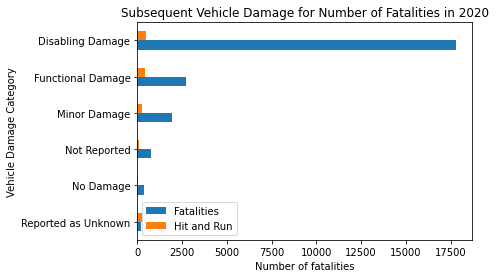

In [937]:
# Just in 2020 - not needed; percent is more relevant to compare with holiday percentages in 2020
plt.figure(figsize=(10,12));
labels = ["Fatalities", "Hit and Run"];

joined_2020_df.groupby(by=["deformedname"]).sum().sort_values(by= "inj_sev", 
                                                    ascending=False)[["inj_sev", 'hit_run']].head(20).sort_values( by="inj_sev", ascending=True).plot(kind= 'barh');

plt.title("Subsequent Vehicle Damage for Number of Fatalities in 2020");
plt.xlabel("Number of fatalities");
plt.ylabel("Vehicle Damage Category");
plt.legend(labels=labels);

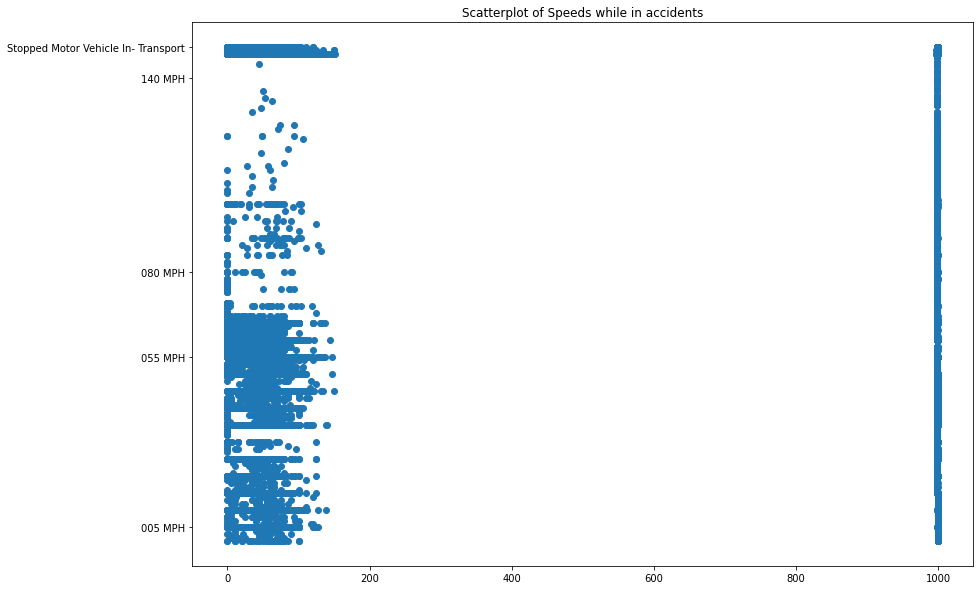

In [812]:
plt.figure(figsize= (14,10))
plt.scatter((df_vehicle['trav_sp']), df_vehicle['trav_spname'].sort_values())
# plt.yticks(ticks=df_vehicle['trav_spname'].value_counts())
plt.yticks(ticks=['140 MPH','080 MPH', '005 MPH', '055 MPH', 'Stopped Motor Vehicle In- Transport'])
plt.title("Scatterplot of Speeds while in accidents");
## Need to clean the unreported to look at actual reported speeds

In [813]:
# df_vehicle[['impact1name', 'impact1']][0:10].plot(kind = 'bar');

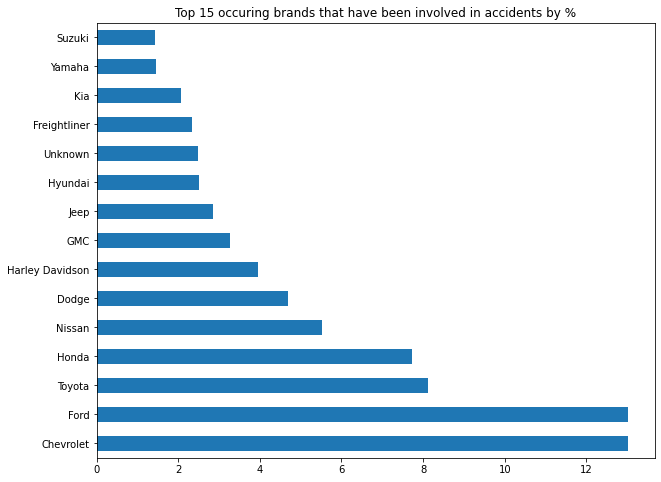

In [740]:
## Top 15 occuring brands that have been involved in accidents
plt.figure(figsize=(10,8))
(df_vehicle['vpicmakename'].value_counts(ascending=False, normalize=True)[0:15]*100).plot(kind= 'barh')
plt.title("Top 15 occuring brands that have been involved in accidents by %");

In [838]:
df_vehicle['vpicmakename'].value_counts(ascending=False).sum()

54272

In [839]:
## Super terrible calculation of Percent of Motorcycle accidents compared to all Makes

len((df_vehicle[df_vehicle.vpicmakename == 'Harley Davidson'])  + (df_vehicle[df_vehicle.vpicmakename == 'Yamaha']) +  (df_vehicle[df_vehicle.vpicmakename == 'Suzuki'])) / (df_vehicle['vpicmakename'].value_counts(ascending=False).sum())*100

6.8617334905660385

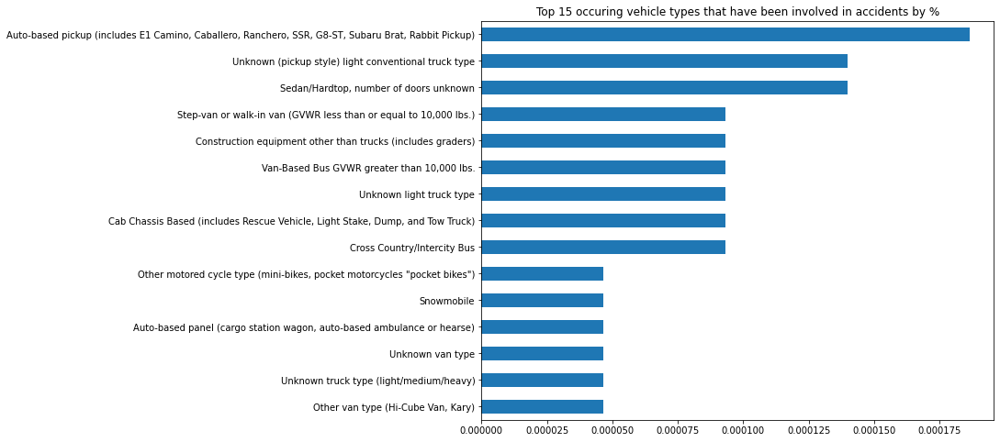

In [859]:
## Top 15 occuring vehicle types that have been involved in accidents
plt.figure(figsize=(10,8))
(df_vehicle_cols['body_typname'].value_counts(normalize=True, ascending=True)[:15]).plot(kind= 'barh')
plt.title("Top 15 occuring vehicle types that have been involved in accidents by %");

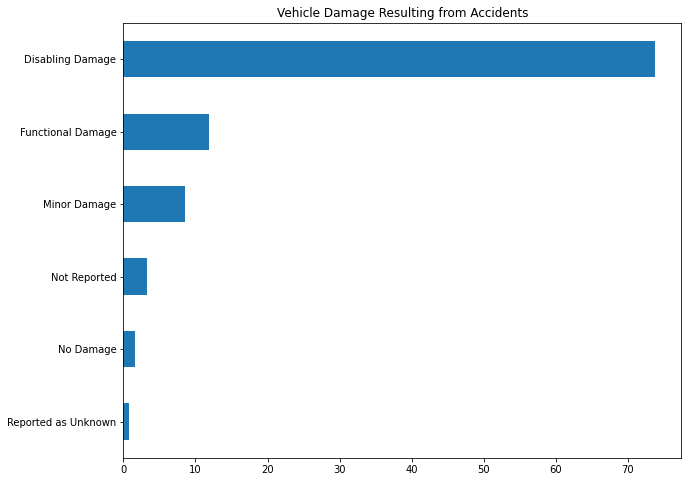

In [860]:
## Top 15 occuring vehicle types that have been involved in accidents
plt.figure(figsize=(10,8))
(df_vehicle_cols['deformedname'].value_counts(normalize=True, ascending=True)*100).plot(kind= 'barh')
plt.title("Vehicle Damage Resulting from Accidents");

In [861]:
df_vehicle_cols['deformedname'].value_counts()

Disabling Damage       15830
Functional Damage       2548
Minor Damage            1846
Not Reported             703
No Damage                350
Reported as Unknown      180
Name: deformedname, dtype: int64

## Cleaning and Feature Engineering

In [257]:
##One hot encoding of features

In [864]:
## Dropping unknown speeds
df_vehicle_cols = df_vehicle[df_vehicle.trav_sp != 999]
df_vehicle.shape

(49246, 201)

In [866]:
df_vehicle_cols['trav_sp']

0        80
5        70
6        10
7        80
8        70
         ..
54267    55
54268    45
54269    55
54270    55
54271    75
Name: trav_sp, Length: 49246, dtype: int64

In [988]:
#Baseline
df_person['inj_sev'].value_counts(normalize=True)
# df_accident['fatals'].value_counts(normalize=True)

4    0.452046
0    0.253513
3    0.105385
2    0.100134
1    0.070303
9    0.015393
5    0.003202
6    0.000023
Name: inj_sev, dtype: float64

In [869]:
df_person.columns.intersection(df_vehicle_cols.columns)

Index(['state', 'statename', 'st_case', 've_forms', 'veh_no', 'day', 'dayname',
       'month', 'monthname', 'hour', 'hourname', 'minute', 'minutename',
       'harm_ev', 'harm_evname', 'man_coll', 'man_collname', 'make',
       'makename', 'mak_mod', 'body_typ', 'body_typname', 'mod_year',
       'mod_yearname', 'tow_veh', 'tow_vehname', 'spec_use', 'spec_usename',
       'emer_use', 'emer_usename', 'rollover', 'rollovername', 'impact1',
       'impact1name', 'fire_exp', 'fire_expname', 'vpicmake', 'vpicmakename',
       'vpicmodel', 'vpicmodelname', 'vpicbodyclass', 'vpicbodyclassname',
       'icfinalbody', 'icfinalbodyname'],
      dtype='object')

## Modeling: Logistic Regression

In [1039]:
features = ['man_collname_The First Harmful Event was Not a Collision with a Motor Vehicle in Transport',
 'harm_evname_Tree (Standing Only)',
 'rolinloc',
 'impact1name_Non-Collision',
 'harm_evname_Rollover/Overturn',
 'm_harm',
 'harm_evname_Ditch',
 'rollovername_Rollover, Tripped by Object/Vehicle',
 'vtrafwayname_Two-Way, Not Divided',
 'rollover',
 'body_typ',
 'vpicmodel',
 'body_typname_Two Wheel Motorcycle (excluding motor scooters)',
 'harm_evname_Embankment',
 'vpicbodyclass',
 'harm_evname_Curb',
 'deformed','deformedname_Functional Damage',
 'numoccsname_06',
 'deformedname_Minor Damage',
 'man_collname_Sideswipe - Opposite Direction',
 'numoccsname_02',
 'numoccsname_05',
 'man_collname_Sideswipe - Same Direction',
 'vtrafwayname_Two-Way,  Divided, Positive  Median Barrier',
 'numoccsname_04',
 'numoccsname_03',
 'impact1name_6 Clock Point',
 'man_collname_Front-to-Rear',
 'harm_evname_Motor Vehicle In-Transport',
 'unittype']

In [1040]:
X = joined_2020_df[features]
y = joined_2020_df['inj_sev']

In [1041]:
joined_2020_df['inj_sev']

0         1
1         0
2         1
3         1
4         0
         ..
155294    0
155295    0
155296    0
155297    1
155298    0
Name: inj_sev, Length: 153277, dtype: int64

In [1042]:
## train test  Splitting 

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [1043]:
# Instantiate our model.
logreg = LogisticRegression(max_iter=1000)

sc = StandardScaler()

# Z_train = sc.fit_transform(X_train)
# Z_test = sc.transform(X_test)
#  Fit our model.
logreg.fit(X_train, y_train)

print(f'Log Reg Intercept: {logreg.intercept_}')
# print(f'Log Reg Coeff: {logreg.coef_}')

Log Reg Intercept: [-0.02119562]


In [1044]:
#  Generate predicted values.
logreg.predict(X_test)

array([1, 0, 0, ..., 1, 0, 0])

In [1045]:
#Evaluate model
logreg.score(X_test, y_test)

0.6013048016701461

In [698]:
X_train.shape, y_train.shape

((114957, 31), (114957,))

In [689]:
X_test.shape, y_test.shape

((38320, 31), (38320,))

In [690]:
y.value_counts(normalize=True)

0    0.607854
1    0.392146
Name: inj_sev, dtype: float64

In [691]:
X_test.shape, y_test.shape

((38320, 31), (38320,))

In [692]:
#Performing slightly better than the base line

In [700]:
coef_table = pd.DataFrame(list(X_train.columns)).copy()
coef_table.insert(len(coef_table.columns),"Coefs",logreg.coef_.transpose())
coef_table

,0,Coefs
0,man_collname_The First Harmful Event was Not a...,0.013438
1,harm_evname_Tree (Standing Only),0.004134
2,rolinloc,0.020731
3,impact1name_Non-Collision,0.002503
4,harm_evname_Rollover/Overturn,0.002290
5,m_harm,0.009675
6,harm_evname_Ditch,0.001420
7,"rollovername_Rollover, Tripped by Object/Vehicle",0.002186
8,"vtrafwayname_Two-Way, Not Divided",-0.003267
9,rollover,0.008384


In [ ]:
print(list(zip(model_1.coef_, model_1_features)))

In [671]:
bestfeatures = SelectKBest(score_func=chi2, k=2)
fit = bestfeatures.fit(X_train,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Specs', 'Score']
print(featureScores.nlargest(20, 'Score'))

                                                Specs         Score
11                                          vpicmodel  1.261209e+07
14                                      vpicbodyclass  1.304334e+05
10                                           body_typ  1.108131e+04
2                                            rolinloc  4.852208e+03
5                                              m_harm  4.575710e+03
0   man_collname_The First Harmful Event was Not a...  2.666421e+03
9                                            rollover  1.951299e+03
1                    harm_evname_Tree (Standing Only)  1.308215e+03
29             harm_evname_Motor Vehicle In-Transport  1.221688e+03
28                         man_collname_Front-to-Rear  1.061164e+03
3                           impact1name_Non-Collision  6.524992e+02
27                          impact1name_6 Clock Point  5.989845e+02
4                       harm_evname_Rollover/Overturn  5.616279e+02
6                                   harm_evname_

In [1046]:
count = 0
model_params = {}

In [1047]:
## Random Forrest classifier

model_params = model_params
count = count

## n_jobs chooses the number of cores your computer will use
rf = RandomForestClassifier(random_state=33)

# I want to gridsearch my params

params = {
    'n_estimators' : [225, 275],
    'max_features' : ['auto', None],
    'max_depth' : [ 50, 70],
    'min_samples_leaf' : [2, 3],
    'ccp_alpha' : [0.002, 0.001]
}

In [1048]:
# Instantiating our Gridsearch
gs = GridSearchCV(rf, param_grid=params, cv=3, n_jobs=-1, verbose=1)

# Fitiing our Gridsearch
gs.fit(X_train, y_train)

# Increasing our counter
# count += 1

# # Creating a new Key - Value pair on the best_params_ dictionary & then adding that to our model_df
# #gs.best_params_['score'] = gs.best_score_
# model_params[f'model_{count}'] = gs.best_params_

# # turning all of this into a Dataframe
# model_df = pd.DataFrame.from_dict(model_params, orient='index')

# model_df

Fitting 3 folds for each of 32 candidates, totalling 96 fits


KeyboardInterrupt: 

### Joining data

In [ ]:
# # function for merging data

# def get_merged_dataframes(main_df, main_df_columns, csv_files, year, merge_columns):
#     # print(main_df, main_df_columns, csv_files, year, merge_columns)
#     df1 = pd.read_csv(f'./data/{year}_fars/{main_df}.csv', encoding='unicode_escape')
#     df1.columns = df1.columns.str.lower()
#     merged_dataframe = df1[df1.columns.intersection(main_df_columns)]
    
#     for csv in csv_files:
#         try:
#             df2 = pd.read_csv(f'./data/{year}_fars/{csv}.csv', encoding='unicode_escape')
#             df2.columns = df2.columns.str.lower() 
#             merged_dataframe = pd.merge(merged_dataframe, df2, how='outer', on=merge_columns, suffixes=('', '_remove'))
#             merged_dataframe = merged_dataframe.drop([column for column in merged_dataframe.columns if 'remove' in column], axis=1)
#         except FileNotFoundError:
#             print(f'The {csv} file does not exist for the year {year}.')           
    
#     merged_dataframe.loc[:,'data_year'] = year
    
#     return merged_dataframe

#### Merge all vehicle-level data

In [ ]:
# def combine_vehicle_data(start_year, end_year=None):  
    
#     vehicle_columns =['VEH_NO', "STATE" , "ST_CASE", "VEH_NO","VEH_NO", "NUMOCCS", "PNUMOCCS" , "UNITTYPE", "PTYPE" , "HIT_RUN", "REG_STAT", "OWNER", "MAKE",
#          "MODEL", "BODY_TYP", "PBODY_TYP", "VIN", "MOD_YEAR", "vPICMAKE", 'vPICMODEL', 'IMPACT1', 'vPICBODYCLASS', 'ICFinalBody', 'GVWR_From', 'TOW_VEH'
#          'J_KNIFE', 'MCARR_ID', 'V_CONFIG', 'CARGO_BT', 'HAZ_INV', 'BUS_USE', 'SPEC_USE', 'EMER_USE', 'TRAV_SP', 'ROLLOVER', 'ROLINLOC', 'DEFORMED',
#          'TOWED', 'M_HARM', 'VEHICLESF', 'FIRE_EXP']

    
#     vehicle_columns = [x.lower() for x in vehicle_columns]


#     csvs_to_merge = ['accident']
    
#     merge_columns = ['state', 'st_case']
    
#     if end_year is None:
#         end_year = start_year
    
#     full_df_list = [get_merged_dataframes('vehicle', vehicle_columns, csvs_to_merge, year, merge_columns) for year in range(start_year, end_year + 1)]
    
#     return pd.concat(full_df_list, ignore_index=True)
        

In [ ]:
# full_vehicle_df = combine_vehicle_data(2010, 2020)


In [ ]:
# full_vehicle_df.isna().sum()

In [50]:
# df_accident['countyname']

0           ELMORE (51)
1        JEFFERSON (73)
2          SHELBY (117)
3          CALHOUN (15)
4            COOSA (37)
              ...      
35761      LARAMIE (21)
35762      LINCOLN (23)
35763      FREMONT (13)
35764      LARAMIE (21)
35765       PLATTE (31)
Name: countyname, Length: 35766, dtype: object

In [46]:
for_map = Map(location=[30.169621, -96.683617], zoom_start=6, )

In [85]:
# hm_wide = HeatMap(list(zip(df_accident['latitude'],df_accident['longitud'])),
#     min_opacity=0.2,
#     radius=10, 
#     blur=11, 
#     max_zoom=1,
# )

In [86]:
# for_map.add_child(hm_wide)


In [72]:
# !pip install plotly-geo==1.0.0
# !pip install geopandas==0.3.0
# !pip install pyshp==1.2.10
# !pip install shapely

In [79]:
import plotly.figure_factory as ff

import numpy as np
import pandas as pd


# df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/minoritymajority.csv')
# df_sample_r = df_sample[df_sample['STNAME'] == 'California']

# values = df_sample_r['TOT_POP'].tolist()
# fips = df_sample_r['FIPS'].tolist()

# colorscale = [
#     'rgb(193, 193, 193)',
#     'rgb(239,239,239)',
#     'rgb(195, 196, 222)',
#     'rgb(144,148,194)',
#     'rgb(101,104,168)',
#     'rgb(65, 53, 132)'
# ]

# fig = ff.create_choropleth(
#     fips=fips, values=values, scope=['CA', 'AZ', 'Nevada', 'Oregon', ' Idaho'],
#     binning_endpoints=[14348, 63983, 134827, 426762, 2081313], colorscale=colorscale,
#     county_outline={'color': 'rgb(255,255,255)', 'width': 0.5}, round_legend_values=True,
#     legend_title='Population by County', title='California and Nearby States'
# )
# fig.layout.template = None
# fig.show()

In [80]:
# df_accident['state'].value_counts()